In [2]:
%reload_ext autoreload
%autoreload 2
from core.utils import Path, AnnotatedImage
from core import utils
import numpy as np
import typing as tp
from matplotlib import pyplot as plt
import itertools

from PIL import Image

In [89]:
def show_image(path: Path):
    plt.imshow(utils.parse_image(path))

# Eigencat

Yu Tomita and John McCloskey

# Outline

- Motivation

- Cat Dataset Overview

- Program Flow

- Data Cleaning (Cat Aligners)

- Singular Value Decomposition

- Results

- Conclusion / Future Directions

# Motivation

## Eigenface

![my image](images_yu/eigeneyes.png)

L. Sirovich; M. Kirby (1987). "Low-dimensional procedure for the characterization of human faces". <i>Journal of the Optical Society of America</i> A. <b>4</b> (3): 519–524.

![my image](images_yu/eigenfaces.png)

![my image](images_yu/cuties.png)

# Cat Dataset

- kaggle (https://www.kaggle.com/crawford/cat-dataset)

[Point(x=115, y=122),
 Point(x=179, y=121),
 Point(x=133, y=169),
 Point(x=95, y=70),
 Point(x=93, y=17),
 Point(x=131, y=46),
 Point(x=233, y=39),
 Point(x=281, y=9),
 Point(x=224, y=69)]

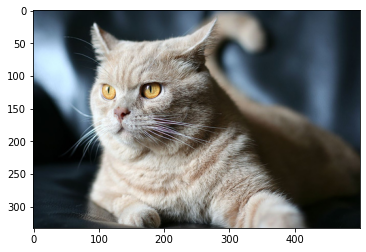

In [3]:
cat_path = utils.Paths.INPUT_PATH / "CAT_00" / "00000001_012.jpg"
cat = AnnotatedImage.from_image_path(cat_path)

show_image(cat.image)
cat.points

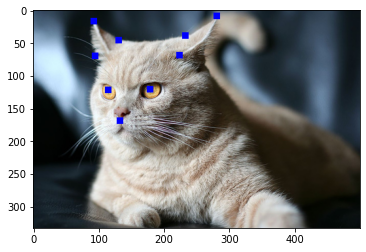

In [4]:
def load_cat_with_points(path):
    cat = AnnotatedImage.from_image_path(cat_path)
    temp_cat = utils.parse_image(cat.image)

    for point in cat.points:
        # NOTE that x and y are flipped!
        temp_cat[point.y-5: point.y+5, point.x-5: point.x+5] = [0,0,255]
        
    return temp_cat


cat_path = utils.Paths.INPUT_PATH / "CAT_00" / "00000001_012.jpg"
plt.imshow(load_cat_with_points(cat_path))

## Program Flow


![title](images_yu/cat_flow.png)

# Data Cleaning

### 3 methods for comparison


1. Simple (`CatAlignerSimple`)
2. Using eyes (`CatAlignerEyes`)
3. Using 9 points (`CatAlignerLSTSQ`)

#### `CatAlignerSimple`

- Crop to the smallest image that contains 9 points, then scale to 100 x 100.

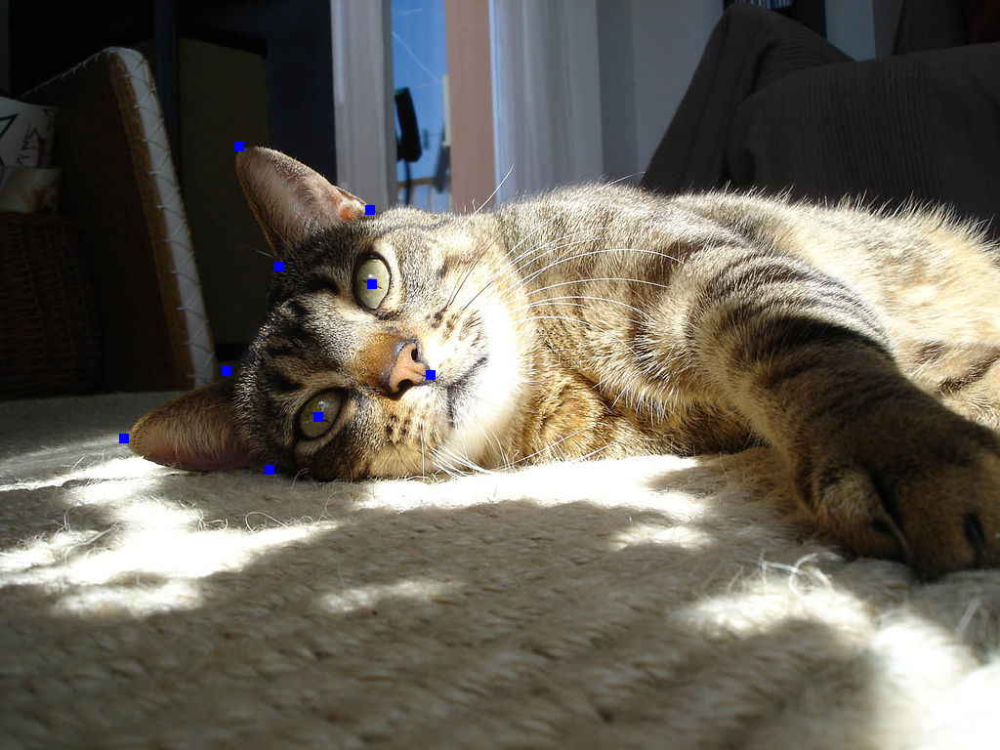

In [6]:
cat_path = utils.Paths.INPUT_PATH / "CAT_05" / "00001289_022.jpg"

cat = load_cat_with_points(cat_path)
img = Image.fromarray(cat.astype(np.uint8))
display(img)

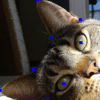

In [9]:
cat_path = utils.Paths.INPUT_PATH / "CAT_05" / "00001289_022.jpg"
cat = AnnotatedImage.from_image_path(cat_path)

def truncate_by_all_points(
    img: Image.Image,
    points: tp.List[tp.List[int]],
    *,
    width: int,
    height: int,
) -> Image.Image:
    xs, ys = zip(*points)
    cropped = img.crop((min(xs), min(ys), max(xs), max(ys)))
    return cropped.resize((width, height))

new_img = truncate_by_all_points(img, cat.points, width=100, height=100)
display(new_img)

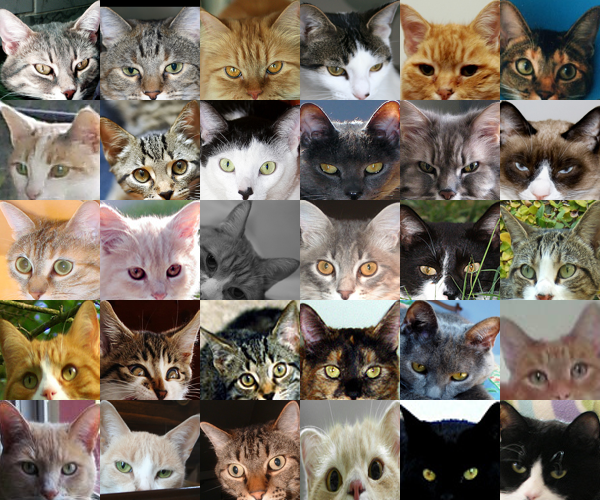

In [7]:
from core.cat_aligner import CatAlignerSimple, stack_images

aligned = tuple(CatAlignerSimple.gen_aligned(n=30, width=100, height=100))
many_cats = stack_images(aligned)
display(many_cats)

#### `CatAlignerEyes`

- Set eyes to static locations. Crop with margings from eyes.

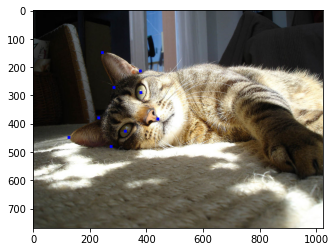

In [20]:
plt.imshow(load_cat_with_points(cat_path))

![title](images_yu/angled0.png)

![title](images_yu/angled1.png)

![title](images_yu/angled2.png)

![title](images_yu/angled4.png)

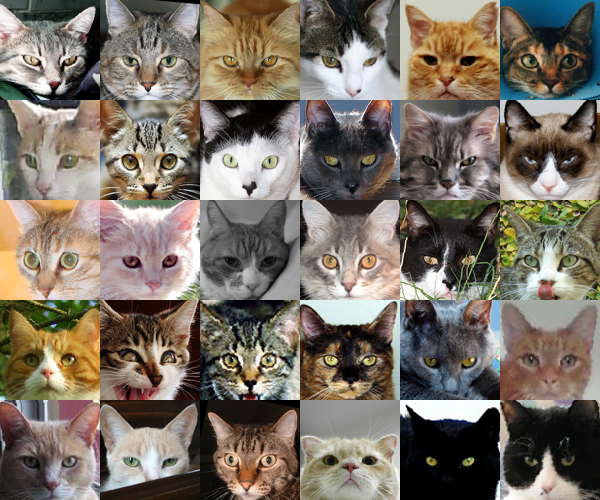

In [8]:
from core.cat_aligner import CatAlignerEyes, stack_images

aligned = tuple(CatAlignerEyes.gen_aligned(n=30, width=100, height=100))
many_cats = stack_images(aligned)
display(many_cats)

#### `CatAlignerLSTSQ`

1 Choose a standard cat.

2 Transform other cats to put their 9 points closer to the standard.

- Choose a "standard" cat, and find the coordinates
![title](images_yu/standard_cat.png)

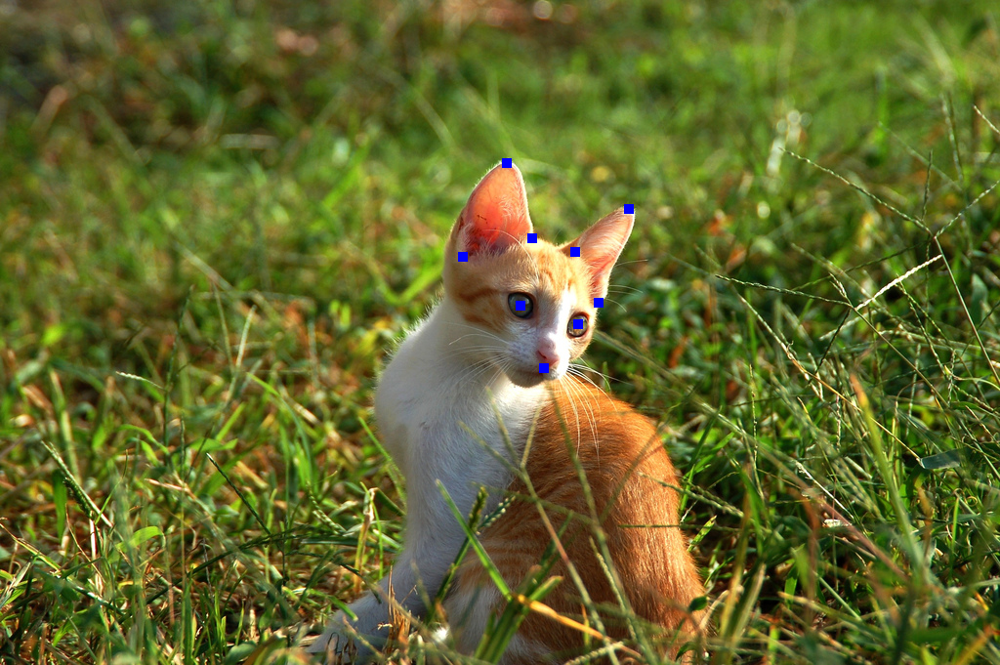

In [5]:
cat_path = utils.Paths.INPUT_PATH / "CAT_00" / "00000038_020.jpg"
cat = load_cat_with_points(cat_path)
img = Image.fromarray(cat.astype(np.uint8))
display(img)

![title](images_yu/9_0.png)

![title](images_yu/9_1.png)

![title](images_yu/2x2matrix.png)

"A" is a 2x2 matrix for linear transformation. It can (1) rotate and (2) scale the (x,y) cordinates.

![title](images_yu/svd_ellipse.png)

How about <b>(3) translation</b>?

We can add another dimension

![title](images_yu/3x3matrix.png)

array([[302, 302, 413, 253,  92, 185, 187,  94, 255],
       [466, 634, 556, 359, 334, 463, 630, 751, 727]])

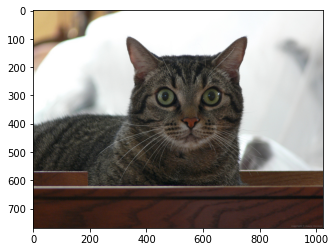

In [179]:
standard_cat_path = utils.Paths.INPUT_PATH / "CAT_00" / "00000055_003.jpg"
standard_cat = AnnotatedImage.from_image_path(standard_cat_path)

standard_points = utils.Point.to_np(standard_cat.points)[:, [1, 0]].T # flip x and y

show_image(standard_cat.image)
standard_points

array([[313, 332, 377, 263, 167, 244, 258, 214, 310],
       [533, 592, 557, 474, 519, 545, 589, 644, 613]])

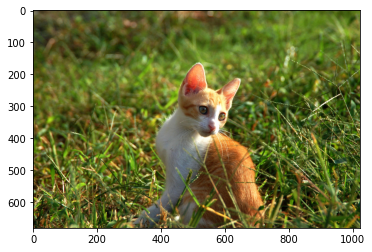

In [99]:
test_cat_path = utils.Paths.INPUT_PATH / "CAT_00" / "00000038_020.jpg"
test_cat = AnnotatedImage.from_image_path(test_cat_path)

test_points = utils.Point.to_np(test_cat.points)[:, [1, 0]].T # flip x and y
show_image(test_cat.image)
test_points

In [103]:
# add row of 1s to make support translation by multiplication

one_col = np.ones((1, 9))

standard = np.append(standard_points, one_col, 0)
test = np.append(test_points, one_col, 0)
test

array([[313., 332., 377., 263., 167., 244., 258., 214., 310.],
       [533., 592., 557., 474., 519., 545., 589., 644., 613.],
       [  1.,   1.,   1.,   1.,   1.,   1.,   1.,   1.,   1.]])

In [160]:
from numpy import linalg 

# test.T @ x = standard.T
#   A @ test ~= standard
x, residuals, rank, singlar = linalg.lstsq(a=test.T, b=standard.T, rcond=None) # a @ x = b
A = x.T
A

array([[ 1.59583670e+00, -5.27344089e-01,  8.88935336e+01],
       [ 4.81012274e-01,  2.71601980e+00, -1.11458942e+03],
       [ 1.86316248e-15, -9.16367676e-16,  1.00000000e+00]])

In [161]:
# transformed points
np.rint(A @ test).astype(int)

array([[307, 307, 397, 259,  82, 191, 190,  91, 260],
       [484, 653, 580, 299, 375, 483, 609, 737, 699],
       [  1,   1,   1,   1,   1,   1,   1,   1,   1]])

In [162]:
standard

array([[302., 302., 413., 253.,  92., 185., 187.,  94., 255.],
       [466., 634., 556., 359., 334., 463., 630., 751., 727.],
       [  1.,   1.,   1.,   1.,   1.,   1.,   1.,   1.,   1.]])

To apply this matrix to the whole image, we need to get all cordinates for each pixel

In [163]:
rgb_pixels = utils.parse_image(test_cat.image)
rgb_pixels

array([[[100,  91,  62],
        [ 99,  92,  64],
        [101,  95,  69],
        ...,
        [ 93, 113,  28],
        [ 91, 114,  26],
        [ 92, 115,  27]],

       [[ 99,  92,  64],
        [ 99,  92,  64],
        [100,  93,  67],
        ...,
        [ 92, 114,  29],
        [ 92, 116,  28],
        [ 93, 117,  29]],

       [[ 99,  93,  67],
        [100,  94,  68],
        [102,  94,  71],
        ...,
        [ 94, 119,  28],
        [ 94, 121,  28],
        [ 93, 122,  29]],

       ...,

       [[ 89,  62,  19],
        [133, 116,  62],
        [ 78,  62,  10],
        ...,
        [116, 127,  58],
        [116, 126,  57],
        [117, 124,  57]],

       [[129,  49,  22],
        [127,  78,  46],
        [ 65,  49,  13],
        ...,
        [116, 126,  55],
        [119, 127,  54],
        [128, 131,  60]],

       [[193, 113,  78],
        [134,  70,  42],
        [ 84,  58,  21],
        ...,
        [108, 117,  52],
        [121, 127,  55],
        [127, 128,  60]]

In [164]:
rgb_pixels.shape

(681, 1024, 3)

In [165]:
def _get_coordinates(test_cat_image: np.array):
    h, w, _ = test_cat_image.shape
    points_gen = itertools.product(range(1, h + 1), range(1, w + 1))
    
    coordinates_2d = np.array(list(points_gen)).T

    # add column with ones for translation
    return np.append(coordinates_2d, np.ones((1, h * w)), 0).astype(int)


points_from = _get_coordinates(rgb_pixels)
points_from

array([[   1,    1,    1, ...,  681,  681,  681],
       [   1,    2,    3, ..., 1022, 1023, 1024],
       [   1,    1,    1, ...,    1,    1,    1]])

In [174]:
# Apply the same transformation matrix for all coordinates

points_to = np.rint(A @ points_from).astype(int)
points_to = np.clip(points_to, a_min=0, a_max=1024) # remove outside boundary

points_to

array([[  90,   89,   89, ...,  637,  636,  636],
       [   0,    0,    0, ..., 1024, 1024, 1024],
       [   1,    1,    1, ...,    1,    1,    1]])

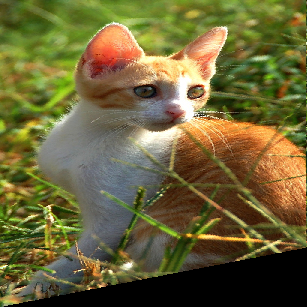

In [175]:
# remove third row, then coordinates -> index
src_xy = points_from[:2, :] - 1
new_xy = ((points_to[:2, :] - 1) * 0.3).astype(int)

# separate into two vectors
src_x, src_y = src_xy[0, :], src_xy[1, :]
dst_x, dst_y = new_xy[0, :], new_xy[1, :]

final_image = np.zeros([dst_x.max() + 1, dst_y.max() + 1, 3]).astype(int)

# Copy RGB from the source coordinates to the destination
final_image[dst_x, dst_y] = rgb_pixels[src_x, src_y]
img = Image.fromarray(final_image.astype(np.uint8))
display(img)

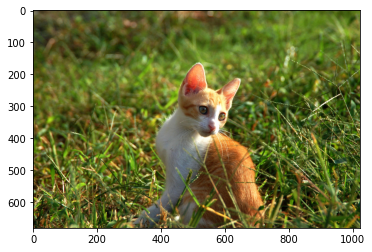

In [176]:
show_image(test_cat.image)

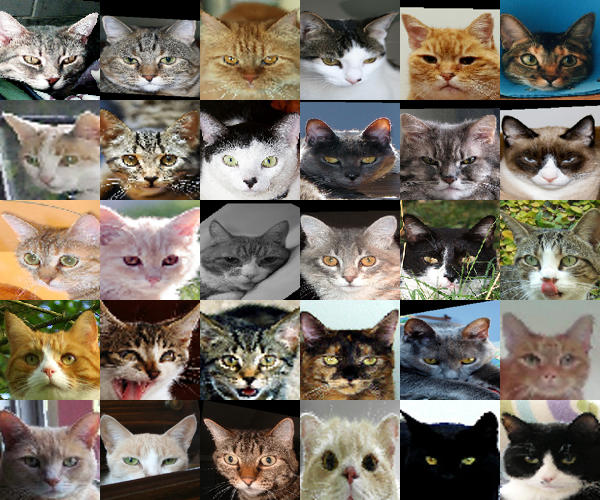

In [9]:
from core.cat_aligner import CatAlignerLSTSQ, stack_images

aligned = tuple(CatAlignerLSTSQ.gen_aligned(n=30, width=100, height=100))
many_cats = stack_images(aligned)
display(many_cats)

# Singular Value Decomposition

In [1]:
from __future__ import annotations

from pathlib import Path
import numpy as np
from matplotlib import pyplot as plt

from core import cat_aligner, utils

from PIL import ImageOps, Image
import IPython.display


In [2]:
out_folder = Path("/tmp/temp_cats")
aligner = cat_aligner.CatAlignerEyes
n_samples = 10_000

all_files = utils.Paths.list_sorted_files()
files = all_files[:n_samples]
names = [f.image.stem[4:] for f in files]


In [3]:
arr = utils.parse_image(files[0].image)
print(arr.shape)
print(arr[:, :, 0])

(500, 375, 3)
[[115 115 121 ... 138 137 137]
 [116 107 115 ... 138 138 137]
 [117 108 101 ... 137 136 136]
 ...
 [119 130 118 ...  45  37  39]
 [ 94  95  92 ...  52  51  53]
 [ 93  70  81 ...  56  56  60]]


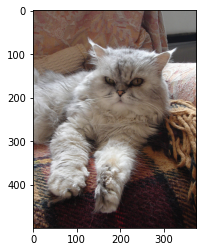

In [4]:
plt.imshow(arr)

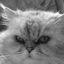

In [5]:
images = [ImageOps.grayscale(aligner.align_one_image(f, 64, 64)) for f in files]
shape = np.array(images[0]).shape
images[0]

In [6]:
X_train = np.array([np.array(im).flatten() for im in images])
X_train

array([[ 87,  89,  92, ..., 120, 109, 114],
       [  0,   0,   0, ...,  24,  22,  25],
       [136, 114, 107, ..., 169, 170, 178],
       ...,
       [151, 154, 110, ...,  56,  28,   6],
       [  0,   0,   0, ..., 137, 128,  90],
       [ 72,  76, 109, ..., 190, 193, 191]], dtype=uint8)

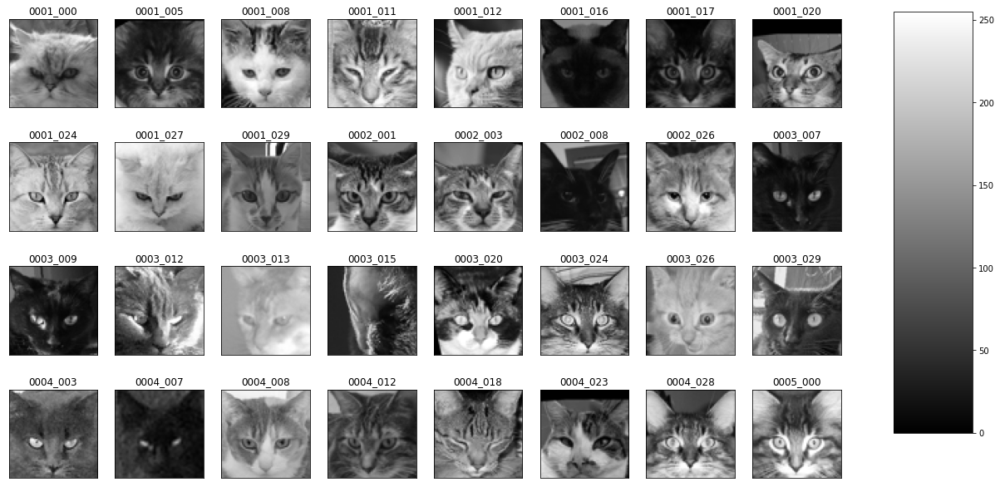

In [7]:
utils.plot_portraits(X_train, shape, 4, 8, titles=names, vmax=255, vmin=0, colorbar=True)

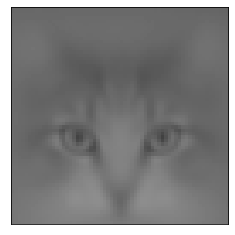

In [8]:
X_mean = X_train.mean(axis=0)
utils.plot_image(X_mean, shape=shape, vmax=255, vmin=0)

In [9]:
def dilate_components(arr: np.ndarray) -> np.ndarray:
    return arr - arr.min()

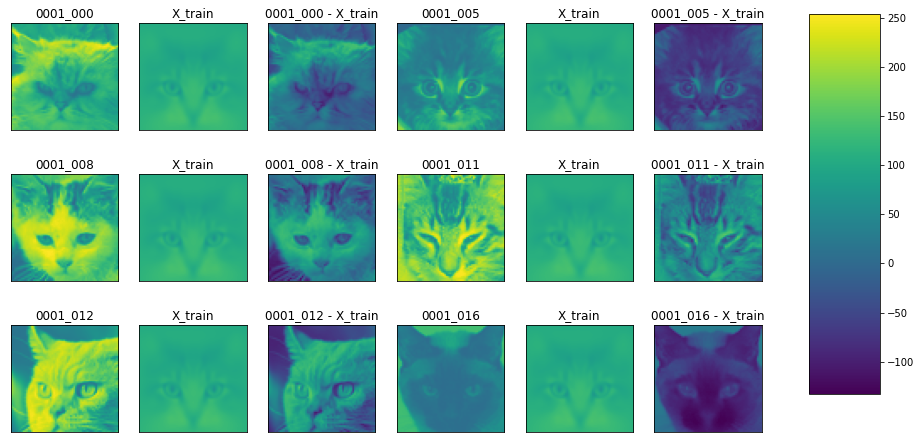

In [10]:
portraits, titles = [], []
for i in range(6):
    portraits.extend([X_train[i], X_mean, X_train[i] - X_mean])
    titles.extend([names[i], 'X_train', f'{names[i]} - X_train'])

portraits = np.array(portraits)
vmax, vmin = portraits.max(), portraits.min()
utils.plot_portraits(portraits, shape, 3, 6, titles=titles, vmax=vmax, vmin=vmin, cmap='viridis',colorbar=True)

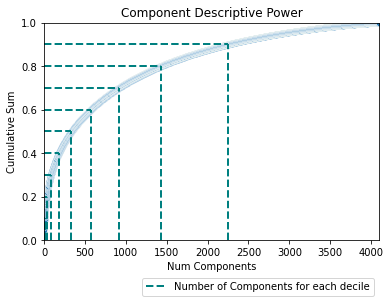

In [11]:
U, S, Vt = np.linalg.svd(X_train - X_mean, full_matrices=False)

utils.plot_principle_components(S)



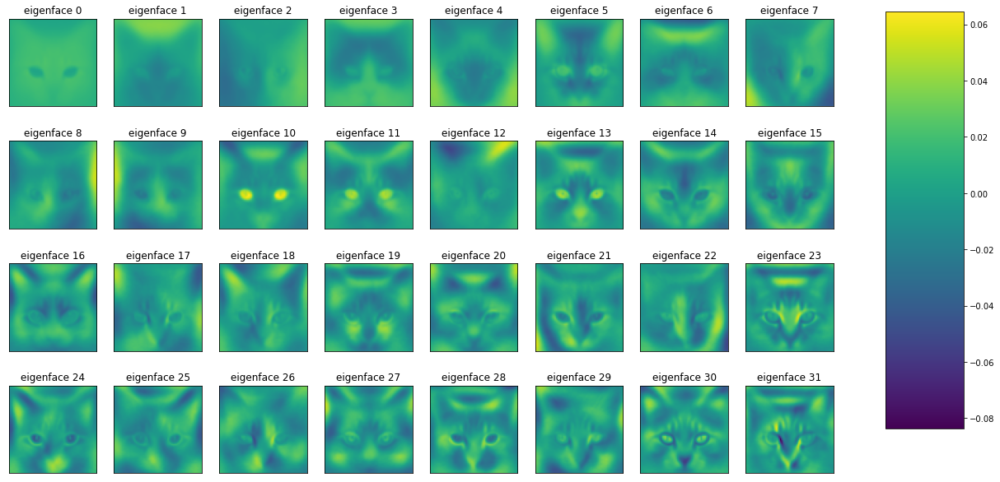

In [12]:
eigenfaces = Vt[:32]
eigenface_titles = [f"eigenface {i}" for i in range(32)]
utils.plot_portraits(Vt, shape, 4, 8, eigenface_titles, vmin=eigenfaces.min(), vmax=eigenfaces.max(), colorbar=True, cmap='viridis')

In [22]:
def reconstruct_with_components(
    image: int | slice | list[int], component: int | slice
):
    principle_compoents = U[image, component] * S[component]
    principle_directions = Vt[component]

    return (principle_compoents @ principle_directions) + X_mean
out_folder.mkdir(exist_ok=True)
gif_folder = out_folder / "gif_subimages"

gif_folder.mkdir(exist_ok=True)

S_cum = S.cumsum() / S.sum()

percentiles = [0, 1]
for x in np.arange(0, 1, 0.02):
    idx = np.searchsorted(S_cum, x)
    if idx > percentiles[-1]:
        percentiles.append(idx)

for n_components in percentiles:

    X_final = reconstruct_with_components(slice(32), slice(n_components))
    fig = utils.plot_portraits(
        X_final, shape, 4, 8, titles=names, suptitle=f"{n_components} Components", vmin=0, vmax=255, colorbar=True
    )
    out_folder.mkdir(exist_ok=True)
    fig.savefig(gif_folder / f"{n_components}_components.png")



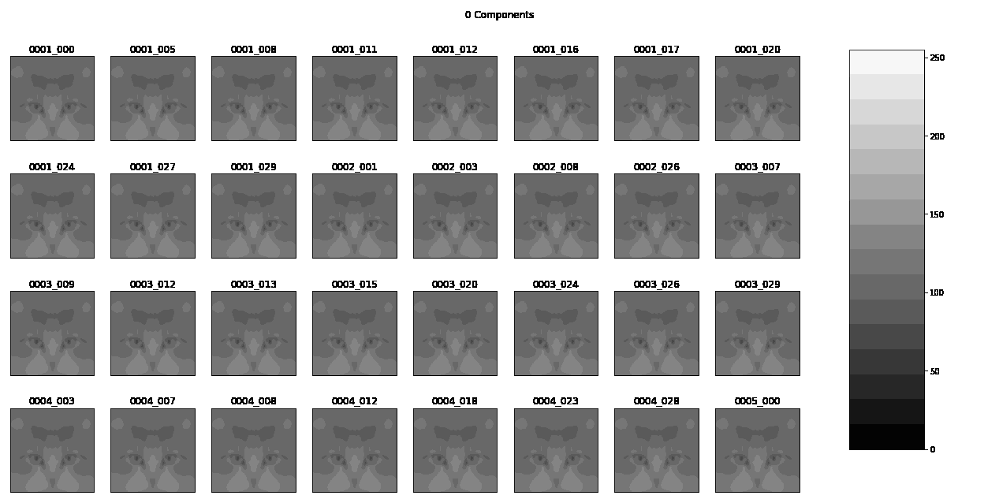

In [24]:
def save_gif(*, outpath: Path, subimage_dir: Path) -> Path:
    def key(path: Path) -> int:
        return int(path.stem[: path.stem.find("_")])

    files = sorted(subimage_dir.iterdir(), key=key)
    img, *imgs = [Image.open(f) for f in files]

    img.save(
        fp=outpath,
        format="GIF",
        append_images=imgs,
        save_all=True,
        duration=200,
        loop=0,
    )

    return outpath
    
gif_path = save_gif(outpath=out_folder / "iterative_components.gif", subimage_dir=gif_folder)

IPython.display.Image(gif_path)

In [17]:
Vt.shape, U.shape, S.shape

((4096, 4096), (9997, 4096), (4096,))

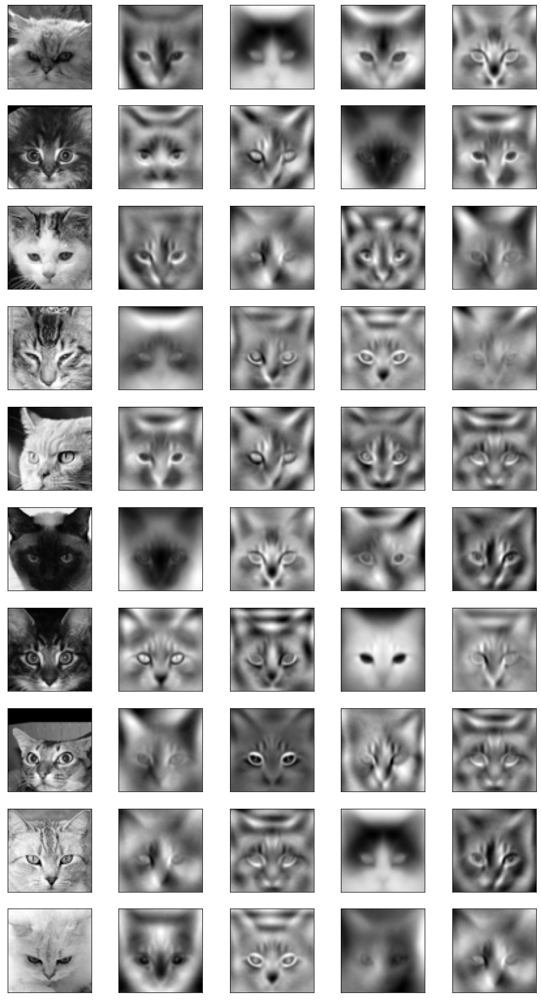

In [21]:
import seaborn as sns
portraits = []
for i in range(10):
    y = np.abs((U * S) @ Vt.T)[i, :50]
    portraits.extend([X_train[i], *Vt[(len(y) - y.argsort()).argsort()][:4]])
utils.plot_portraits(portraits, shape=shape, n_row=10, n_col=5)
# sns.scatterplot(y=np.abs(Vt.T @ (U * S))[18], x=range(100))
# len(portraits)

# Results

# simple_100

## simple_100: sample_processed_images
<center><img src="images/simple_100/sample_processed_images.png"></center>


## simple_100: eigenfaces
<center><img src="images/simple_100/eigenfaces.png"></center>


## simple_100: Principle Components
<center><img src="images/simple_100/Principle Components.png"></center>


## simple_100: iterative_components
<center><img src="images/simple_100/iterative_components.gif"></center>


## ![my image](images/simple_100/gif_subimages/1_components.png)

## ![my image](images/simple_100/gif_subimages/2_components.png)

## ![my image](images/simple_100/gif_subimages/3_components.png)

# simple

## simple: sample_processed_images
<center><img src="images/simple/sample_processed_images.png"></center>


## simple: eigenfaces
<center><img src="images/simple/eigenfaces.png"></center>


## simple: Principle Components
<center><img src="images/simple/Principle Components.png"></center>


## simple: iterative_components
<center><img src="images/simple/iterative_components.gif"></center>


## ![my image](images/simple/gif_subimages/1_components.png)

## ![my image](images/simple/gif_subimages/3_components.png)

## ![my image](images/simple/gif_subimages/5_components.png)

# eyes

## eyes: sample_processed_images
<center><img src="images/eyes/sample_processed_images.png"></center>


## eyes: eigenfaces
<center><img src="images/eyes/eigenfaces.png"></center>


## eyes: Principle Components
<center><img src="images/eyes/Principle Components.png"></center>


## eyes: iterative_components
<center><img src="images/eyes/iterative_components.gif"></center>


## ![my image](images/eyes/gif_subimages/1_components.png)

## ![my image](images/eyes/gif_subimages/2_components.png)

## ![my image](images/eyes/gif_subimages/4_components.png)

# lstsq

## lstsq: sample_processed_images
<center><img src="images/lstsq/sample_processed_images.png"></center>


## lstsq: eigenfaces
<center><img src="images/lstsq/eigenfaces.png"></center>


## lstsq: Principle Components
<center><img src="images/lstsq/Principle Components.png"></center>


## lstsq: iterative_components
<center><img src="images/lstsq/iterative_components.gif"></center>


## ![my image](images/lstsq/gif_subimages/1_components.png)

## ![my image](images/lstsq/gif_subimages/3_components.png)

## ![my image](images/lstsq/gif_subimages/5_components.png)

# Conclusion

- Simple works decently

- Eyes and Least Squares give much better eigenfaces

- The number of components needed to account for all the noise stays consistent

# Future Directions

- Use distance from each eigenvector as labels to train a model that would then classify cats into prospective types (to decompose our own cats)

- Use clustering to cluster groups of cats in the first few PCA dimensions and fine commonalities